In [1]:
%matplotlib inline

In [2]:
import IPython
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error 
from matplotlib import pyplot as plt
import seaborn as sb
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import warnings 
warnings.filterwarnings('ignore')
warnings.filterwarnings('ignore', category=DeprecationWarning)
# pip install git+https://github.com/tensorflow/docs
import tensorflow as tf
import tensorflow_docs as tfdocs
import tensorflow_docs.plots
import tensorflow_docs.modeling
# Libraries and options
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation, Flatten

In [1]:
from xgboost import XGBRegressor

In [44]:
### Prepare libraries, stopwords, and lematizer
import nltk
from nltk import word_tokenize, pos_tag
from nltk.sentiment.util import mark_negation
import re

# Preloading corpus: 
# nltk.download('wordnet')
# nltk.download('stopwords')
# nltk.download('sentiwordnet')
from nltk.corpus import wordnet as wn
from nltk.corpus import sentiwordnet as swn

from nltk.corpus import stopwords
discard_tokens = stopwords.words('dutch')

from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

In [56]:
# credits belong to Emma for providing us with this code
def sentiment_score(text):
    #### Sentiment WITH pos tags and negation, WITHOUT skipping incompatible tags
    sentence = text
    tokens = word_tokenize(sentence)
    tokens_neg = mark_negation(tokens)
    tagged = pos_tag(tokens_neg)
    print(tagged)

    def penn_to_wn(tag):
        """
        Convert between the PennTreebank tags to simple Wordnet tags
        """
        if tag.startswith('J'):
            return wn.ADJ
        elif tag.startswith('N'):
            return wn.NOUN
        elif tag.startswith('R'):
            return wn.ADV
        elif tag.startswith('V'):
            return wn.VERB
        return None

    sentiment = 0.0
    lemma_list = []
    for word, tag in tagged:
        
        # Check for negation
        neg_coef = 1
        if re.search("_NEG$", word):
            neg_coef = -1
            word = re.sub("_NEG$", "", word)
        
        # Convert pos tag
        tag_converted = penn_to_wn(tag)
        
        # Find Lemma
        if tag_converted not in (wn.NOUN, wn.ADJ, wn.ADV, wn.VERB):
            lemma = lemmatizer.lemmatize(word)
        else:
            lemma = lemmatizer.lemmatize(word, pos=tag_converted)   
        if not lemma:
            continue
        #lemma = lemmatizer.lemmatize(word)
        lemma_list.append(lemma)
    print(sentiment)
    print(lemma_list)

    return sentiment

In [1]:
from funda.load_data import DataLoader
funda_2020 = data_loader.load_funda_data_2020()
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner()
funda_2020_cleaned = data_cleaner.clean_funda_2020(data=funda_2020)
'''broker_reviews = data_loader.load_broker_reviews()
broker_reviews_sub = broker_reviews[:50] 
broker_reviews_sub['Review_sentiment'] = broker_reviews_sub['Reviews'].apply(lambda x: sentiment_score(x))
broker_reviews_sub'''
sentiment_score("Freshly renovated house upon for sale.")

NameError: name 'data_loader' is not defined

In [74]:
df = pd.DataFrame([[4, 9,8]] * 3, columns=['A', 'B','C'])
df = df.join(df.apply(lambda x: [1, "5,6,7"], axis=1, result_type='expand')).rename(columns={0:'sentiment',1:'description_features'})
df

,A,B,C,sentiment,description_features
0,4,9,8,1,"5,6,7"
1,4,9,8,1,"5,6,7"
2,4,9,8,1,"5,6,7"


In [23]:
broker_reviews_sub[broker_reviews_sub.Review_sentiment < 0]

,SalesAgent,ReviewType,Reviews,ReviewScore,ReviewDate,Review_sentiment
7,11 Makelaars Amsterdam,Sale reviews,Wij zijn prima geadviseerd en geholpen door Ni...,9.0,13 May 2020,-0.250
8,11 Makelaars Amsterdam,Sale reviews,Makelaar Niels heeft ons fantastisch begeleid ...,9.0,15 February 2020,-0.500
16,& Bijleveld makelaardij b.v.,Sale reviews,Alice en Angelique hebben me enorm geholpen me...,9.8,17 November 2020,-0.125
29,2M Makelaars,Buy reviews,"2M Makelaars, en in ons geval Bianca van den B...",10.0,16 December 2015,-0.375
70,11 Makelaars Amsterdam,Sale reviews,"11 Makelaars zijn zeer deskundig, snel en effi...",10.0,14 August 2018,-0.250
80,123 makelaar o.z.,Sale reviews,Mijn huis via Huybert van 123 makelaar verkoch...,10.0,12 August 2019,-0.125
103,& Bijleveld makelaardij b.v.,Sale reviews,Uitstekende begeleiding van de makelaar van be...,10.0,3 July 2020,-0.125
115,Aelmans Rentmeesters- & Makelaarskantoor B.V.,Sale reviews,Perfecte makelaars in de persoon van Ans Dumme...,9.0,18 September 2020,-0.125
120,Adfinis Makelaars,Buy reviews,De communicatie verliep vlot. Snelle reactie. ...,10.0,15 July 2020,-0.125
121,Adfinis Makelaars,Buy reviews,Remko heeft ons heel fijn geholpen bij de aank...,8.0,29 April 2020,-0.125


In [19]:
broker_reviews_sub.describe()

,ReviewScore,Review_sentiment
count,500.000000,500.000000
mean,9.249800,0.304310
std,0.908179,0.405306
min,3.000000,-0.625000
25%,9.000000,0.000000
50%,9.300000,0.250000
75%,10.000000,0.500000
max,10.800000,2.125000


# 1. Data Preprocessing

## Load Data

In [4]:
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
funda_2018 = data_loader.load_funda_data_2018()
funda_2020 = data_loader.load_funda_data_2020()


Funda data of 2018 successfully loaded
Funda data of 2020 successfully loaded


In [16]:
pd.DataFrame(''.join(funda_2018['houseType'].drop_duplicates().to_list()).split(">")).drop_duplicates()[0].to_list()


['<{woonboot}',
 ' <{vrijstaande woning}',
 '<{eengezinswoning}',
 ' <{tussenwoning}',
 '<{tussenverdieping}',
 ' (<{appartement}',
 ')<{eengezinswoning}',
 ' <{geschakelde 2-onder-1-kapwoning}',
 '<{woonboerderij}',
 ' <{hoekwoning}',
 '<{portiekflat}',
 ' <{2-onder-1-kapwoning}',
 '<{galerijflat}',
 '<{villa}',
 ' (<{waterwoning}',
 ')<{tussenverdieping}',
 '<{beneden + bovenwoning}',
 ' <{geschakelde woning}',
 ' <{halfvrijstaande woning}',
 '<{bovenwoning}',
 ')<{galerijflat}',
 ')<{bovenwoning}',
 ')<{maisonnette}',
 ')<{benedenwoning}',
 '<{herenhuis}',
 ' <{eindwoning}',
 '<{penthouse}',
 ')<{bungalow}',
 '<{bungalow}',
 ' (<{bedrijfs- of dienstwoning}',
 '<{landhuis}',
 '<{benedenwoning}',
 ')<{herenhuis}',
 ' (<{drive-in woning}',
 ')<{grachtenpand}',
 ' (<{patiowoning}',
 ')<{villa}',
 ' (<{split-level woning}',
 ' (<{dubbel bovenhuis}',
 ' (<{semi-bungalow}',
 '<{maisonnette}',
 ' <{OpenPortiek}',
 ')<{portiekwoning}',
 ')<{woonboot}',
 ' (<{service flat}',
 ' (<{dijkwoning}

,SalesAgent,ReviewType,Reviews,ReviewScore,ReviewDate
0,11 Makelaars Amsterdam,Buy reviews,"Niels is een persoonlijke makelaar, een mensen...",10.0,25 June 2019
1,& Bijleveld makelaardij b.v.,Buy reviews,Vanaf het eerste contact t/m het ondertekenen ...,9.5,21 October 2020
2,& Bijleveld makelaardij b.v.,Buy reviews,Superb service! I got a great help and support...,10.5,19 May 2020
3,& Bijleveld makelaardij b.v.,Buy reviews,Geweldige service en deskundig advies voor ges...,9.5,27 March 2020
4,& Bijleveld makelaardij b.v.,Buy reviews,"Prettig contact gedurende het aankooptraject, ...",9.5,24 January 2020
...,...,...,...,...,...
272263,Makelaarsland,Sale reviews,Vind het raar dat je een makelaar krijgt toege...,6.5,27 December 2012
272264,Makelaarsland,Sale reviews,Deze makelaar gekozen omdat ik zelf huis mag/m...,5.5,26 December 2012
272265,Makelaarsland,Sale reviews,Het contact met de makelaar verliep goed. Alti...,7.5,22 December 2012
272266,Makelaarsland,Sale reviews,Afgezien van opstellen van het koopcontract en...,6.5,20 December 2012


In [46]:
cbs_info.dtypes

ID                                int64
WijkenEnBuurten                  object
Gemeentenaam_1                   object
Codering_3                       object
Mannen_6                          int64
Vrouwen_7                         int64
k_0Tot15Jaar_8                    int64
k_15Tot25Jaar_9                   int64
k_25Tot45Jaar_10                  int64
k_45Tot65Jaar_11                  int64
k_65JaarOfOuder_12                int64
Bevolkingsdichtheid_33           object
Woningvoorraad_34                 int64
PercentageBewoond_38             object
PercentageOnbewoond_39           object
Koopwoningen_40                  object
HuurwoningenTotaal_41            object
BouwjaarVoor2000_45              object
BouwjaarVanaf2000_46             object
GemiddeldInkomenPerInwoner_66    object
MeestVoorkomendePostcode_103     object
Dekkingspercentage_104           object
dtype: object

## Clean Data

In [3]:
import pandas as pd
import numpy as np
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner()
def clean_funda_2020(data):
    # Replace all None values by NaN
    data = data.replace("None", np.NaN)
    # Drop column Ownership situation
    data = data.drop(axis=1, columns='Ownership situation')
    # Remove m³ removed from parcelsurface  
    data['parcelsurface'] = data['parcelsurface'].str.replace(r'\D', '').astype(int)
    # Remove \r \n from housetype
    data['housetype'] = data['housetype'].str.rstrip('\r\n')
    # Replace 0 in Garden_binary with NaN
    data['garden_binary'] = data['garden_binary'].replace(0, np.nan)      

    def calculate_mean_yearofbuilding_funda_2020(date):
        date = date.replace('After ', '') # replace 'After ' with empty
        date = date.replace('Before ', '') # replace 'Before ' with empty
        if "-" in date: # check whether there is a '-' in the column
            date = date.split("-") # if yes, split the two dates
            date = (int(date[0]) + int(date[1])) / 2 # calculate the mean of the two dates
            return(int(date)) # return the mean date
        else:
            return int(date) # if not, return the only date

        # apply function to each row of the column 
    data['yearofbuilding'] = data['yearofbuilding'].apply(lambda date: calculate_mean_yearofbuilding_funda_2020(date))
    print("Funda data 2020 cleaned")
    return data
funda_2020.dtypes
funda_2020_cleaned = data_cleaner.clean_funda_2020(data=funda_2020)
funda_2020_cleaned
#funda_2018 = funda_2018[['sellingPrice','Asking_Price_M2', 'yearofbuilding', 'numberrooms', 'numberbathrooms', 'energylabelclass','surface']]

Funda data 2020 cleaned


,zipcode,sellingPrice,Asking_Price_M2,Facilities,Cadastre_Title,Ownership situation,fulldescription,housetype,parcelsurface,yearofbuilding,...,numberrooms,numberbathrooms,energylabelclass,surface,sales_agent,buying_agent,sellingDate,publicationDate,sellingtime,url
0,3417EK,315000,2943.925234,Electricity,MONTFOORT A 5048,Full ownership,Deze gunstig gelegen tussenwoning is twee jaar...,"Single-family home, row house",107,1982,...,5,1,C,107,Beumer Garantiemakelaars,Verschoor Makelaardij & Assurantiën BV,2020-12-02,2020-11-27,5,https://www.funda.nl/en/koop/verkocht/montfoor...
1,3862KT,335000,1340.000000,NaN,NIJKERK M 635,Full ownership,In een rustige woonwijk met zeer veel groen ge...,"Single-family home, corner house",250,1976,...,4,1,C,250,Van de Ridder Makelaars,NaN,2020-12-02,2020-11-19,13,https://www.funda.nl/en/koop/verkocht/nijkerk/...
2,6852RJ,395000,2801.418440,Electricity,HUISSEN G 2103,Full ownership,Tribunusallee 39 te Huissen Modern afgewerkte...,"Single-family home, corner house",141,2010,...,5,2,A,141,Hermsen Garantiemakelaars Huissen,NaN,2020-12-01,2020-11-19,12,https://www.funda.nl/en/koop/verkocht/huissen/...
3,1431HZ,375000,2314.814815,Electricity,AALSMEER C 2721,Full ownership,Would you like to live in one of the nicest st...,"Single-family home, row house",162,1941,...,5,1,F,162,Eveleens Makelaars,Peters en Partners Amstelveen,2020-12-01,2020-11-21,10,https://www.funda.nl/en/koop/verkocht/aalsmeer...
4,2548HV,425000,3320.312500,Electricity,'S-GRAVENHAGE AX 8313,Municipal ownership encumbered with long-term ...,Zeer fraai en luxueus afgewerkte 5 kamer eenge...,"Single-family home, row house",128,2008,...,4,1,A,128,Olsthoorn NVM Makelaars,NaN,2020-12-03,2020-11-24,9,https://www.funda.nl/en/koop/verkocht/den-haag...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
217165,5612AB,459000,2467.741935,NaN,NaN,NaN,BUNKERTOREN EINDHOVEN: Schrijf je nu in! Ga na...,Apartment with shared street entrance (apartment),186,2019,...,2,1,A,186,vb&t Nieuwbouwmakelaars,NaN,2019-12-10,2019-12-06,4,https://www.funda.nl/en/koop/verkocht/eindhove...
217166,4364AK,115000,440.613027,NaN,MARIEKERKE K 856,Full ownership,"Het betreft hier een ""kopen naar wens"" woning....","Single-family home, double house",261,1947,...,4,2,D,261,Sinke Komejan Makelaars,NaN,2019-11-29,2019-11-29,0,https://www.funda.nl/en/koop/verkocht/grijpske...
217167,5612AB,354500,1704.326923,NaN,NaN,NaN,Modern wonen op een historische plek in Eindho...,Apartment with shared street entrance (apartment),208,2019,...,3,1,A,208,vb&t Nieuwbouwmakelaars,NaN,2019-12-10,2019-12-06,4,https://www.funda.nl/en/koop/verkocht/eindhove...
217168,3994ZC,415000,2577.639752,NaN,HOUTEN A 8467,Full ownership,direct verkocht,"Single-family home, row house",161,1998,...,1,1,B,161,Brecheisen Makelaars Houten B.V.,NaN,2019-12-10,2019-12-10,0,https://www.funda.nl/en/koop/verkocht/houten/h...


In [62]:
def funda_features(funda_2018):
    funda_2018 = funda_2018.drop_columns(columns=['sellinDate'])
    return funda

In [61]:
funda_2018_cleaned

,publicationDate,zipcode,sellingPrice,fullDescription,houseType,categoryObject,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,energylabelClass,surface,sellingDate,sellingTime
0,2018-07-31,1774PG,139000.0,"Ruimte, vrijheid, en altijd het water en de we...",woonboot vrijstaande woning,Woonhuis,1975,1,NaN,3,0.0,0,62,2018-11-12,104
1,2018-09-24,7481LK,209000.0,Verrassend ruime tussenwoning nabij het centru...,eengezinswoning tussenwoning,Woonhuis,1980,1,148.0,5,1.0,B,136,2018-08-30,-25
2,2018-08-02,1068MS,267500.0,- ENGLISH TRANSLATION - On the 21st of Septemb...,tussenverdieping (appartement),Appartement,2005,0,NaN,3,0.0,0,70,2018-11-23,113
3,2018-08-04,5628EN,349000.0,Wonen in een zeer royaal bemeten geschakelde 2...,eengezinswoning geschakelde 2-onder-1-kapwoning,Woonhuis,1973,1,244.0,5,0.0,0,144,2018-12-14,132
4,2018-08-05,7731TV,495000.0,Landgoed Junne is een eeuwenoud landgoed en li...,woonboerderij vrijstaande woning,Woonhuis,1900,0,4500.0,8,1.0,0,323,2018-12-06,123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211612,2018-12-31,9791GD,159000.0,Ruime eengezinswoning aangeboden aan de rand v...,eengezinswoning tussenwoning,Woonhuis,1974,1,195.0,5,0.0,0,116,2019-03-07,66
211613,2018-12-31,6431GT,179000.0,Nabij centrum van Hoensbroek met al haar voorz...,eengezinswoning geschakelde 2-onder-1-kapwoning,Woonhuis,1995,1,160.0,4,1.0,0,84,2019-01-17,17
211614,2018-12-31,4051EW,391500.0,Ook de kans aangrijpen om te mogen wonen in de...,bungalow vrijstaande woning (semi-bungalow),Woonhuis,1948,1,465.0,5,0.0,0,99,2019-08-03,215
211615,2018-12-31,4043GG,375000.0,"BIEDEN VANAF € 375.000,= kosten koperHet uitzi...",eengezinswoning 2-onder-1-kapwoning,Woonhuis,2006,1,300.0,7,1.0,A,172,2019-04-08,98


In [5]:
postcodes = postcodes.rename(columns={'PC6':'zipcode','Buurt2020':'NeighborhoodCode','Gemeente2020':'MunicipalityCode','Wijk2020':'DistrictCode'}).astype({'NeighborhoodCode':'object'}).drop_duplicates(subset='zipcode', keep="first")
postcodes['MunicipalityCode'] = postcodes['MunicipalityCode'].apply(lambda x: ("GM"+str(x)))
postcodes['DistrictCode'] = postcodes['DistrictCode'].apply(lambda x: ("WK"+str(x)))

In [41]:
funda_2018_cleaned

,publicationDate,zipcode,sellingPrice,fullDescription,houseType,categoryObject,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,energylabelClass,surface,sellingDate,sellingTime
0,2018-07-31,1774PG,139000.0,"Ruimte, vrijheid, en altijd het water en de we...",woonboot vrijstaande woning,Woonhuis,1975,1,NaN,3,0.0,0,62,2018-11-12,104
1,2018-09-24,7481LK,209000.0,Verrassend ruime tussenwoning nabij het centru...,eengezinswoning tussenwoning,Woonhuis,1980,1,148.0,5,1.0,B,136,2018-08-30,-25
2,2018-08-02,1068MS,267500.0,- ENGLISH TRANSLATION - On the 21st of Septemb...,tussenverdieping (appartement),Appartement,2005,0,NaN,3,0.0,0,70,2018-11-23,113
3,2018-08-04,5628EN,349000.0,Wonen in een zeer royaal bemeten geschakelde 2...,eengezinswoning geschakelde 2-onder-1-kapwoning,Woonhuis,1973,1,244.0,5,0.0,0,144,2018-12-14,132
4,2018-08-05,7731TV,495000.0,Landgoed Junne is een eeuwenoud landgoed en li...,woonboerderij vrijstaande woning,Woonhuis,1900,0,4500.0,8,1.0,0,323,2018-12-06,123
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
211612,2018-12-31,9791GD,159000.0,Ruime eengezinswoning aangeboden aan de rand v...,eengezinswoning tussenwoning,Woonhuis,1974,1,195.0,5,0.0,0,116,2019-03-07,66
211613,2018-12-31,6431GT,179000.0,Nabij centrum van Hoensbroek met al haar voorz...,eengezinswoning geschakelde 2-onder-1-kapwoning,Woonhuis,1995,1,160.0,4,1.0,0,84,2019-01-17,17
211614,2018-12-31,4051EW,391500.0,Ook de kans aangrijpen om te mogen wonen in de...,bungalow vrijstaande woning (semi-bungalow),Woonhuis,1948,1,465.0,5,0.0,0,99,2019-08-03,215
211615,2018-12-31,4043GG,375000.0,"BIEDEN VANAF € 375.000,= kosten koperHet uitzi...",eengezinswoning 2-onder-1-kapwoning,Woonhuis,2006,1,300.0,7,1.0,A,172,2019-04-08,98


In [7]:
funda_2018_cleaned_merged = funda_2018_cleaned.merge(postcodes, how="inner")

In [8]:
funda_2018_cleaned_features = funda_2018_cleaned_merged[['sellingPrice','categoryObject','yearOfBuilding','garden','parcelSurface','numberRooms','numberBathrooms','energylabelClass','surface','sellingTime','DistrictCode','MunicipalityCode']]
funda_2018_cleaned_features.head(5)
gt = funda_2018_cleaned_features

In [9]:
gt.describe()

,sellingPrice,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,surface,sellingTime
count,2.060210e+05,206021.000000,206021.000000,142654.000000,206021.000000,206021.00000,206021.000000,206021.000000
mean,3.192454e+05,1972.543008,0.708137,554.703471,4.659015,0.79288,119.725737,60.543304
std,2.046853e+05,38.385454,0.454621,2676.771049,1.589610,0.58347,49.822700,70.344514
min,0.000000e+00,1005.000000,0.000000,10.000000,1.000000,0.00000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,143.000000,4.000000,0.00000,90.000000,18.000000
50%,2.695000e+05,1978.000000,1.000000,208.000000,5.000000,1.00000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,348.000000,5.000000,1.00000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,312195.000000,41.000000,8.00000,3210.000000,618.000000


In [10]:
gt.shape

(206021, 12)

In [11]:
gt = gt[gt['sellingPrice']>0]

In [12]:
gt.head()

,sellingPrice,categoryObject,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,energylabelClass,surface,sellingTime,DistrictCode,MunicipalityCode
0,139000.0,Woonhuis,1975,1,NaN,3,0.0,0,62,104,WK191105,GM1911
1,209000.0,Woonhuis,1980,1,148.0,5,1.0,B,136,-25,WK15800,GM158
2,267500.0,Appartement,2005,0,NaN,3,0.0,0,70,113,WK36381,GM363
3,549500.0,Woonhuis,2007,1,143.0,6,1.0,A,161,54,WK36381,GM363
4,287500.0,Appartement,2007,0,NaN,3,1.0,0,72,38,WK36381,GM363


In [13]:
# Exclude columns containing missing values
def get_cols_with_no_nans(df):
    cols_with_no_nans = []
    for col in df.columns:
        if not df[col].isnull().any():
            cols_with_no_nans.append(col)
    return cols_with_no_nans

cols_no_nans = get_cols_with_no_nans(gt)
gt = gt[cols_no_nans]
gt.describe()

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,sellingTime
count,2.052890e+05,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000
mean,3.203838e+05,1972.549591,0.708168,4.657225,0.793345,119.596729,60.638558
std,2.041587e+05,38.357972,0.454607,1.585636,0.582723,49.511561,70.285650
min,2.150000e+02,1005.000000,0.000000,1.000000,0.000000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,4.000000,0.000000,90.000000,18.000000
50%,2.700000e+05,1977.000000,1.000000,5.000000,1.000000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,5.000000,1.000000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,41.000000,8.000000,3210.000000,618.000000


In [14]:
gt.describe()

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,sellingTime
count,2.052890e+05,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000,205289.000000
mean,3.203838e+05,1972.549591,0.708168,4.657225,0.793345,119.596729,60.638558
std,2.041587e+05,38.357972,0.454607,1.585636,0.582723,49.511561,70.285650
min,2.150000e+02,1005.000000,0.000000,1.000000,0.000000,1.000000,-430.000000
25%,2.000000e+05,1956.000000,0.000000,4.000000,0.000000,90.000000,18.000000
50%,2.700000e+05,1977.000000,1.000000,5.000000,1.000000,114.000000,32.000000
75%,3.750000e+05,2000.000000,1.000000,5.000000,1.000000,139.000000,76.000000
max,9.950000e+06,2988.000000,1.000000,41.000000,8.000000,3210.000000,618.000000


In [15]:
# Rename & extract the variable to predict
target = gt.sellingPrice
gt.drop(['sellingPrice'],axis = 1 , inplace = True)
gt.drop(['sellingTime'],axis = 1 , inplace = True)
gt['Target'] = target

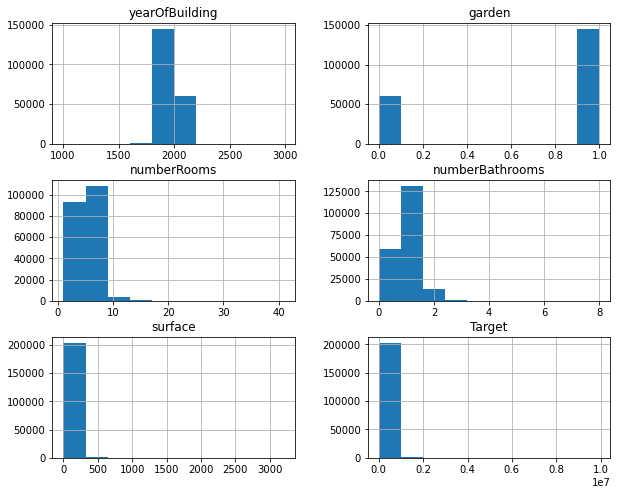

In [47]:
# Overview of feature distribution
gt.hist(figsize = (10,8))
plt.show()

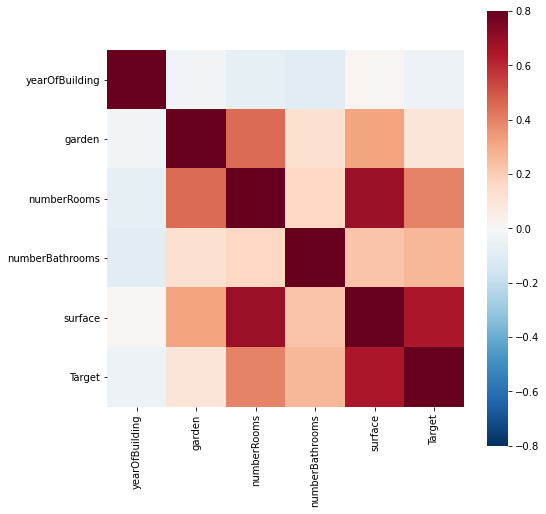

In [16]:
# Compute correlation
correlation_matrix = gt.corr()

# Open figure container
fig = plt.figure(figsize = (8,8))
# Make color heatmap (library seaborn)
sb.heatmap(correlation_matrix, vmax = 0.8, vmin=-0.8, square = True, cmap='RdBu_r')
# Display plot
plt.show()

In [17]:
gt.dtypes

categoryObject       object
yearOfBuilding        int64
garden                int64
numberRooms           int64
numberBathrooms     float64
energylabelClass     object
surface               int64
DistrictCode         object
MunicipalityCode     object
Target              float64
dtype: object

## Dummy Coding Categorical Variables

In [18]:
# Function for the one-hot encoding
def oneHotEncode(df,colNames):
    for col in colNames:
        if( df[col].dtype == np.dtype('object')):
            dummies = pd.get_dummies(df[col],prefix=col)
            df = pd.concat([df,dummies],axis=1)

            #drop the encoded column
            df.drop([col],axis = 1 , inplace=True)
    return df

# Get index of categorical columns 
cat_cols = gt.select_dtypes(include=['object'])
cat_cols = cat_cols.columns

# Transform data
print('There were {} columns before encoding categorical features'.format(gt.shape[1]))
gt = oneHotEncode(gt, cat_cols)
print('There are {} columns after encoding categorical features'.format(gt.shape[1]))

There were 10 columns before encoding categorical features
There are 3365 columns after encoding categorical features


In [19]:
gt.head()

,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,Target,categoryObject_Appartement,categoryObject_Woonhuis,energylabelClass_0,energylabelClass_A,...,MunicipalityCode_GM965,MunicipalityCode_GM971,MunicipalityCode_GM98,MunicipalityCode_GM981,MunicipalityCode_GM983,MunicipalityCode_GM984,MunicipalityCode_GM986,MunicipalityCode_GM988,MunicipalityCode_GM994,MunicipalityCode_GM995
0,1975,1,3,0.0,62,139000.0,0,1,1,0,...,0,0,0,0,0,0,0,0,0,0
1,1980,1,5,1.0,136,209000.0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2005,0,3,0.0,70,267500.0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0
3,2007,1,6,1.0,161,549500.0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0
4,2007,0,3,1.0,72,287500.0,1,0,1,0,...,0,0,0,0,0,0,0,0,0,0


## split data into training and test set

In [49]:
n_train = round(gt.shape[0] * 0.6)
train = gt[:n_train]
test = gt[n_train:]

target = train['Target']
train.drop(['Target'], axis = 1, inplace = True)

truth = test['Target']
test.drop(['Target'], axis = 1, inplace = True)

In [20]:
train, test = train_test_split(gt, test_size=0.4)

target = train['Target']
train.drop(['Target'], axis = 1, inplace = True)

truth = test['Target']
test.drop(['Target'], axis = 1, inplace = True)

# Build neural Network

In [21]:
# Initiate a sequential model (i.e., no recurrence)
NN_model = Sequential()

# Make the first layer
NN_model.add(Dense(11, kernel_initializer='normal',input_dim = train.shape[1], activation='relu'))

# Make hidden layers
NN_model.add(Dense(2560, kernel_initializer='normal',activation='relu'))
NN_model.add(Dense(2560, kernel_initializer='normal',activation='relu'))
#NN_model.add(Dense(256, kernel_initializer='normal',activation='relu'))

# Make the output layer
NN_model.add(Dense(1, kernel_initializer='normal',activation='linear'))

# Compile the network
NN_model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mse','mae'])
NN_model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 11)                37015     
_________________________________________________________________
dense_1 (Dense)              (None, 2560)              30720     
_________________________________________________________________
dense_2 (Dense)              (None, 2560)              6556160   
_________________________________________________________________
dense_3 (Dense)              (None, 1)                 2561      
Total params: 6,626,456
Trainable params: 6,626,456
Non-trainable params: 0
_________________________________________________________________


## checkpoint system

In [22]:
# Define how to name the files
checkpoint_name = 'Weights-{epoch:03d}--{val_loss:.5f}.hdf5' 
# Instantiate the checkpoint system
checkpoint = ModelCheckpoint(checkpoint_name, monitor='val_loss', verbose = 1, save_best_only = True, mode ='auto')
callbacks_list = [checkpoint]

## train model

In [74]:
history = NN_model.fit(train, target, epochs=100, 
             # No. of randomly sampled data points used to compute the errors at each epoch (avoid overfitting)
             batch_size=150, 
             # Size of validation set for cross-validation
             validation_split = 0.2, 
             # Link to checkpoint system, to check teh best model previously built
             callbacks=callbacks_list)

poch 00028: val_loss did not improve from 10147133440.00000
Epoch 29/100
657/657 [==============================] - 27s 41ms/step - loss: 9093113761.0699 - mse: 9093113896.4620 - mae: 58051.0811 - val_loss: 11313613824.0000 - val_mse: 11313613824.0000 - val_mae: 55106.9062

Epoch 00029: val_loss did not improve from 10147133440.00000
Epoch 30/100
657/657 [==============================] - 27s 42ms/step - loss: 8589101974.9544 - mse: 8589101966.3951 - mae: 56231.9122 - val_loss: 11252610048.0000 - val_mse: 11252610048.0000 - val_mae: 58751.9219

Epoch 00030: val_loss did not improve from 10147133440.00000
Epoch 31/100
657/657 [==============================] - 27s 41ms/step - loss: 8789819340.2553 - mse: 8789819394.7234 - mae: 57409.5909 - val_loss: 11695447040.0000 - val_mse: 11695447040.0000 - val_mae: 58078.4414

Epoch 00031: val_loss did not improve from 10147133440.00000
Epoch 32/100
657/657 [==============================] - 28s 43ms/step - loss: 8951055963.0395 - mse: 8951055956.

### vorheriger Best val_loss 9.225631e+09

## Inspect errors, epoch after epoch

In [23]:
# Retrieve the hitory of every epoch's training
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail(25)

NameError: name 'history' is not defined

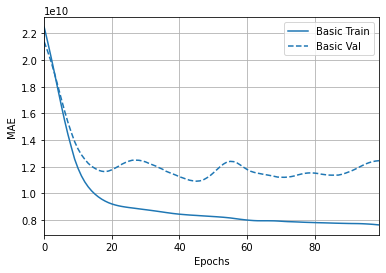

In [77]:
plotter = tfdocs.plots.HistoryPlotter(smoothing_std=2)
plotter.plot({'Basic': history}, metric = "mse")
plt.ylabel('MAE')
plt.show()

# Test the Neural Network

In [24]:
#!# Check best checkpoint in your local folder (the last file saved)
#   Paste the name of the last file saved by tech checkpoint system
weights_file = 'Weights-033--10043379712.00000.hdf5' 

# Load teh parameters of teh models (weights & bias)
NN_model.load_weights(weights_file)
NN_model.compile(loss='mean_squared_error', optimizer='adam', metrics=['mean_squared_error'])
#model.compile(loss='mse',optimizer='sgd',metrics=['accuracy'])

In [25]:
prediction = NN_model.predict(test)

In [26]:
prediction

array([[250431.06],
       [229171.78],
       [205660.44],
       ...,
       [254965.44],
       [211266.83],
       [449718.97]], dtype=float32)

In [73]:
truth

123613    449500.0
123614    299000.0
123615    695000.0
123616    265000.0
123617    289000.0
            ...   
206016    439000.0
206017    225000.0
206018    159000.0
206019    391500.0
206020    375000.0
Name: Target, Length: 82408, dtype: float64

In [69]:
acc = []
for i in range(0,len(prediction)):
    accuracy = prediction[i][0]/truth_array[i]
    if accuracy > 1:
        accuracy =

0
1
2
3
4


In [45]:
accuracy = prediction / truth.to_numpy()

In [47]:
accuracy[0]

array([0.9507532 , 1.42930957, 0.6149116 , ..., 2.68782115, 1.09160552,
       1.13963617])

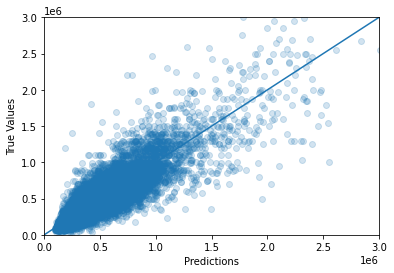

In [27]:
plt.figure()
plt.scatter(prediction, truth, alpha=0.2)
plt.xlabel('Predictions')
plt.ylabel('True Values')
lims = [0, 3000000]
plt.xlim(lims)
plt.ylim(lims)
_ = plt.plot(lims, lims)
plt.show()

In [57]:
error = prediction - truth.to_numpy()
plt.figure()
plt.hist(error[0], bins = 30)
plt.xlabel("Prediction Error")
plt.ylabel("Count")
plt.show()

# develop broker info features

In [1]:
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
broker_info = data_loader.load_broker_info()

In [4]:
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner
broker_info_cleaned = data_cleaner.clean_broker_info(data=broker_info)
broker_info_cleaned

,name_broker,zipcode_broker,description_broker,score_broker,number_reviews_broker,number_houses_for_sale_offered,number_houses_sold_last_12_months,url
0,Schieland Borsboom regio Rotterdam,3011KA,"Met kantoren in Rotterdam, Den Haag en Zoeterm...",9.0,67.0,463.0,392.0,https://www.funda.nl/en/makelaars/kantoor/rott...
1,Makelaarsland,1821BS,Voor veel mensen is een huis kopen of verkopen...,8.8,0.0,585.0,2746.0,https://www.funda.nl/en/makelaars/kantoor/alkm...
2,van Santvoort Makelaars,5654AN,Thuis in uw regio Van Santvoort Makelaars is t...,8.9,153.0,567.0,418.0,https://www.funda.nl/en/makelaars/kantoor/eind...
3,Hans Janssen Garantiemakelaars,6511TE,Wij onderscheiden ons in de eerste plaats door...,8.9,137.0,398.0,473.0,https://www.funda.nl/en/makelaars/kantoor/nijm...
4,Corpowonen,7901AE,Corpowonen is dé landelijke internetmakelaar v...,8.3,3.0,187.0,998.0,https://www.funda.nl/en/makelaars/kantoor/hoog...
...,...,...,...,...,...,...,...,...
2906,Mooijekind Vleut Makelaars Haarlem,2011GX,Wij vinden wonen van levensbelang. Voor iedere...,9.3,294.0,312.0,252.0,https://www.funda.nl/en/makelaars/kantoor/haar...
2907,Beumer Garantiemakelaars,3454HM,De kwaliteit van de dienstverlening die Beumer...,9.2,202.0,166.0,621.0,https://www.funda.nl/en/makelaars/kantoor/de-m...
2908,Boumij Makelaars,5211LX,Boumij Makelaars is sinds januari 1998 geves...,9.0,393.0,145.0,596.0,https://www.funda.nl/en/makelaars/kantoor/den-...
2909,Brockhoff Makelaars,1181RC,"Wilt u uw woning , een woning , of bent u op z...",9.3,288.0,258.0,449.0,https://www.funda.nl/en/makelaars/kantoor/amst...


In [9]:
def featurize_broke_info(broker_info):
    broker_features = broker_info.drop(columns=['zipcode_broker','description_broker','url'])
    return broker_features

In [16]:
featurized_broker_info = featurize_broke_info(broker_info_cleaned)
featurized_broker_info


,name_broker,score_broker,number_reviews_broker,number_houses_for_sale_offered,number_houses_sold_last_12_months
0,Schieland Borsboom regio Rotterdam,9.0,67.0,463.0,392.0
1,Makelaarsland,8.8,0.0,585.0,2746.0
2,van Santvoort Makelaars,8.9,153.0,567.0,418.0
3,Hans Janssen Garantiemakelaars,8.9,137.0,398.0,473.0
4,Corpowonen,8.3,3.0,187.0,998.0
...,...,...,...,...,...
2906,Mooijekind Vleut Makelaars Haarlem,9.3,294.0,312.0,252.0
2907,Beumer Garantiemakelaars,9.2,202.0,166.0,621.0
2908,Boumij Makelaars,9.0,393.0,145.0,596.0
2909,Brockhoff Makelaars,9.3,288.0,258.0,449.0


# Questions

1. why do we use the absolute loss and not the average los?
2. what helps us in the decision making of how many layers etc we are going to use?

# Test featurizing and create combine function

In [ ]:
## LOAD DATA
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
funda_2018 = data_loader.load_funda_data_2018()
funda_2020 = data_loader.load_funda_data_2020()
cbs_info = data_loader.load_cbs_data()
cbs_postcodes = data_loader.load_cbs_postcodes()
crime_info = data_loader.load_crime_data()
tourist_info = data_loader.load_tourist_info()
broker_info = data_loader.load_broker_info()

## CLEAN DATA
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner()
funda_2018 = data_cleaner.cleaned_funda_2018(data=funda_2018)
funda_2020 = data_cleaner.clean_funda_2020(data=funda_2020)
cbs_info = data_cleaner.clean_cbs_info(data=cbs_info)
cbs_postcodes = data_cleaner.clean_cbs_postcodes(data=cbs_postcodes)
crime_info = data_cleaner.clean_crime_info(data=crime_info)
tourist_info = data_cleaner.clean_tourist_info(data=tourist_info)
broker_info = data_cleaner.clean_tourist_info(data=broker_info)

## FEATURIZE DATA
from funda.featurize_data import Featurizer
featurize = Featurizer()
#funda_features = featurize.funda_data()



# test/split/CV function

In [1]:
class DataPartitioner(object):
    '''Class to partition data into train and test,
    and to partition test into 5-fold cross validation splits.
    '''
    def __init__(self, perc_test = 0.2, train_cv_splits = 5, seed = 1234):
        self.perc_test = perc_test
        self.train_cv_splits = train_cv_splits
        self.seed = seed

    def partition_data(self, data):
        obs = data.copy()
        obs_test = obs.sample(frac=self.perc_test, random_state = self.seed).copy()
        obs_test = obs_test.assign(test = True).assign(cv_split=np.nan)

        obs_train = (
        obs.merge(obs_test, how = 'left', indicator = True)
        .query("_merge == 'left_only'")
        .drop('_merge', axis=1)
        .assign(test=False))
        cv_splits = np.random.randint(1, self.train_cv_splits + 1, obs_train.shape[0])
        obs_train = obs_train.assign(cv_split = cv_splits)
        final_obs = pd.concat([obs_test, obs_train]).reset_index(drop=True)
        return final_obs

In [17]:
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
funda_2018 = data_loader.load_funda_data_2018()
funda_2018 = data_cleaner.cleaned_funda_2018(data=funda_2018)

Funda data of 2018 successfully loaded
Funda data 2018 cleaned


In [21]:
Data_partitioner = DataPartitioner()
gt = Data_partitioner.partition_data(data=funda_2018)

In [22]:
gt

,publicationDate,zipcode,sellingPrice,fullDescription,houseType,categoryObject,yearOfBuilding,garden,parcelSurface,numberRooms,numberBathrooms,energylabelClass,surface,sellingDate,sellingTime,test,cv_split
0,2018-06-09,2642JZ,325000.0,In de rustige en kindvriendelijke wijk Tolhek ...,eengezinswoning tussenwoning,Woonhuis,2004,1,123.0,5,1.0,A,122,2018-07-12,33,True,NaN
1,2018-03-04,7894DG,259000.0,"In een leuke woonwijk op een toplocatie, wordt...",eengezinswoning vrijstaande woning,Woonhuis,1997,1,588.0,6,1.0,B,147,2018-03-21,17,True,NaN
2,2018-11-06,4818CG,279000.0,Op gewilde woonlocatie in de wijk Sportpark ge...,eengezinswoning geschakelde woning,Woonhuis,1918,1,172.0,4,1.0,0,90,2018-12-05,29,True,NaN
3,2018-09-28,8277AZ,299000.0,"LET OP! DE VRAAGPRIJS IS EEN VANAFPRIJS, VERKO...",eengezinswoning tussenwoning,Woonhuis,2016,0,84.0,4,1.0,A,143,2018-12-12,75,True,NaN
4,2018-05-09,2953BM,197500.0,Op een fijne locatie bevindt zich deze goed ve...,eengezinswoning tussenwoning,Woonhuis,1966,1,165.0,5,1.0,C,105,2018-05-15,6,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
210901,2018-12-31,1766KS,270000.0,"PRIJSVanaf prijs € 270.000,- k.k.Vraagprijs € ...",eengezinswoning 2-onder-1-kapwoning,Woonhuis,2007,1,373.0,4,0.0,A,121,2019-03-15,74,False,2.0
210902,2018-12-31,1336AH,187000.0,Dit object wordt u aangeboden onder KOOPGARANT...,portiekflat (appartement),Appartement,2011,0,NaN,3,1.0,A,80,2019-01-09,9,False,4.0
210903,2018-12-31,8061DC,227500.0,Zoekt u een (vrijwel) nieuwe woning die zo te ...,eengezinswoning tussenwoning,Woonhuis,2012,1,137.0,4,1.0,A,131,2019-02-01,32,False,5.0
210904,2018-12-31,4051EW,391500.0,Ook de kans aangrijpen om te mogen wonen in de...,bungalow vrijstaande woning (semi-bungalow),Woonhuis,1948,1,465.0,5,0.0,0,99,2019-08-03,215,False,5.0


# Hypertuner

In [2]:
import pandas as pd
import numpy as np
import itertools
from copy import deepcopy

class Hypertuner(object):

    def __init__(self, estimator, tuning_params):
        self.estimator = estimator
        self.tuning_params = tuning_params

    def calculate_mean_cv_error(self, train_set, estimator_cv):
        # now perform cross validation fitting for each split
        splits = train_set['cv_split'].unique().tolist()
        splits.sort()

        cv_errors = []

        for i in splits:
            train_split = train_set.query(f"cv_split != {i}")
            X_train = train_split.drop(['sellingPrice', 'cv_split'],axis=1)
            y_train = train_split['sellingPrice']
            estimator_cv.fit(X=X_train, y = y_train)
            # evaluate the model on split 1
            test_obs = train_set.query(f"cv_split == {i}")
            X_test = test_obs.drop(['sellingPrice', 'cv_split'],axis=1)
            X_truth = test_obs['sellingPrice']
            y_pred = estimator_cv.predict(X_test)
            # calculate error measure on this fold for the estimator with the
            # given parameters
            rmse = np.sqrt(np.sum(np.square(X_truth - y_pred))/X_test.shape[0])
            cv_errors.append(rmse)
        return sum(cv_errors)/len(cv_errors)

    def tune_model(self, train_set):
        '''Perform the hypertuning of the estimator on the train set
        for all the combinations of the hyperparameters
        '''
        parameter_combos = []
        parameter_combos_dicts = []
        for a in itertools.product(*self.tuning_params.values()):
            parameter_combos.append(a)
        for i in parameter_combos:
            d = {}
            for j in range(len(i)):
                d[list(self.tuning_params.keys())[j]] = i[j]
            parameter_combos_dicts.append(d)
        

        tested_models = []

        for d in parameter_combos_dicts:
            print('testing combo: ', d)
            estimator_cv = deepcopy(self.estimator)
            estimator_cv = estimator_cv.set_params(**d)
            mean_cv_error = self.calculate_mean_cv_error(train_set, estimator_cv)
            tested_models.append([d,mean_cv_error])
        print(tested_models)
        return tested_models

In [5]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor

## LOAD DATA
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')
funda_2018 = data_loader.load_funda_data_2018()


## CLEAN DATA
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner()
funda_2018 = data_cleaner.cleaned_funda_2018(data=funda_2018)

## CREATE FEATURES
gt = funda_2018[['sellingPrice','categoryObject','yearOfBuilding','garden','numberRooms','numberBathrooms','energylabelClass','surface']]
print('gt selected')
features = pd.get_dummies(gt)
print('dummies created')

## CERATE TEST/TRAIN & CROSS VALIDATION SET
Data_partitioner = DataPartitioner()
gt = Data_partitioner.partition_data(data=features)
print('Data succesfully preprocessed')

## CREATE RF REGRESSOR AND HYPTERTUNE
'''tuning_params = {"n_estimators": [100, 200],
                "max_depth": [4,6]}
 hypertuner_rf = Hypertuner(estimator = RandomForestRegressor(random_state=1234),
  tuning_params = tuning_params,
  validation_mapping = validation_mapping
  )'''

Funda data of 2018 successfully loaded
Funda data 2018 cleaned
gt selected
dummies created
Data succesfully preprocessed


'tuning_params = {"n_estimators": [100, 200],\n                "max_depth": [4,6]}\n hypertuner_rf = Hypertuner(estimator = RandomForestRegressor(random_state=1234),\n  tuning_params = tuning_params,\n  validation_mapping = validation_mapping\n  )'

In [94]:
gt

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,categoryObject_Appartement,categoryObject_Woonhuis,energylabelClass_0,energylabelClass_A,...,energylabelClass_A++++,energylabelClass_A+++++,energylabelClass_B,energylabelClass_C,energylabelClass_D,energylabelClass_E,energylabelClass_F,energylabelClass_G,test,cv_split
0,325000.0,2004,1,5,1.0,122,0,1,0,1,...,0,0,0,0,0,0,0,0,True,NaN
1,259000.0,1997,1,6,1.0,147,0,1,0,0,...,0,0,1,0,0,0,0,0,True,NaN
2,279000.0,1918,1,4,1.0,90,0,1,1,0,...,0,0,0,0,0,0,0,0,True,NaN
3,299000.0,2016,0,4,1.0,143,0,1,0,1,...,0,0,0,0,0,0,0,0,True,NaN
4,197500.0,1966,1,5,1.0,105,0,1,0,0,...,0,0,0,1,0,0,0,0,True,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206340,270000.0,2007,1,4,0.0,121,0,1,0,1,...,0,0,0,0,0,0,0,0,False,2.0
206341,187000.0,2011,0,3,1.0,80,1,0,0,1,...,0,0,0,0,0,0,0,0,False,3.0
206342,227500.0,2012,1,4,1.0,131,0,1,0,1,...,0,0,0,0,0,0,0,0,False,5.0
206343,391500.0,1948,1,5,0.0,99,0,1,1,0,...,0,0,0,0,0,0,0,0,False,1.0


In [61]:
## CREATE RF REGRESSOR AND HYPTERTUNE
tuning_params = {"n_estimators": [100, 200],
                "max_depth": [6]}
hypertuner_rf = Hypertuner(estimator = RandomForestRegressor(random_state=1234),
  tuning_params = tuning_params)

In [62]:
train_set = gt[gt.test==False].drop(columns=['test'])
train_set

,sellingPrice,yearOfBuilding,garden,numberRooms,numberBathrooms,surface,categoryObject_Appartement,categoryObject_Woonhuis,energylabelClass_0,energylabelClass_A,...,energylabelClass_A+++,energylabelClass_A++++,energylabelClass_A+++++,energylabelClass_B,energylabelClass_C,energylabelClass_D,energylabelClass_E,energylabelClass_F,energylabelClass_G,cv_split
42323,209000.0,1980,1,5,1.0,136,0,1,0,0,...,0,0,0,1,0,0,0,0,0,1.0
42324,267500.0,2005,0,3,0.0,70,1,0,1,0,...,0,0,0,0,0,0,0,0,0,1.0
42325,349000.0,1973,1,5,0.0,144,0,1,1,0,...,0,0,0,0,0,0,0,0,0,3.0
42326,495000.0,1900,0,8,1.0,323,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1.0
42327,162500.0,1970,1,4,1.0,68,0,1,1,0,...,0,0,0,0,0,0,0,0,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206340,270000.0,2007,1,4,0.0,121,0,1,0,1,...,0,0,0,0,0,0,0,0,0,2.0
206341,187000.0,2011,0,3,1.0,80,1,0,0,1,...,0,0,0,0,0,0,0,0,0,3.0
206342,227500.0,2012,1,4,1.0,131,0,1,0,1,...,0,0,0,0,0,0,0,0,0,5.0
206343,391500.0,1948,1,5,0.0,99,0,1,1,0,...,0,0,0,0,0,0,0,0,0,1.0


In [63]:
result = hypertuner_rf.tune_model(train_set)

testing combo:  {'n_estimators': 100, 'max_depth': 6}
testing combo:  {'n_estimators': 200, 'max_depth': 6}
[[{'n_estimators': 100, 'max_depth': 6}, 142730.3251892165], [{'n_estimators': 200, 'max_depth': 6}, 142704.89146659005]]


In [53]:
cv_errors = [1,2,3,4,5]
sum(cv_errors)/len(cv_errors)

3.0

In [64]:
from sklearn.neural_network import MLPRegressor

In [70]:
## CREATE RF REGRESSOR AND HYPTERTUNE
tuning_params = {"hidden_layer_sizes":[10,25,50]}
hypertuner_NN = Hypertuner(estimator = MLPRegressor(activation='relu',solver='adam'),
  tuning_params = tuning_params)

In [71]:
result = hypertuner_NN.tune_model(train_set)

testing combo:  {'hidden_layer_sizes': 10}
testing combo:  {'hidden_layer_sizes': 25}
testing combo:  {'hidden_layer_sizes': 50}
[[{'hidden_layer_sizes': 10}, 153701.61101969023], [{'hidden_layer_sizes': 25}, 152140.3942057808], [{'hidden_layer_sizes': 50}, 151018.03645991115]]


AttributeError: 'Hypertuner' object has no attribute 'get_params'

# Testing Emmanuels featureizing

In [1]:
## LOAD DATA
from funda.load_data import DataLoader

data_loader = DataLoader(base_folder='/Users/Robinkratschmayr2/Library/Mobile Documents/com~apple~CloudDocs/2. Ausbildung/Master/Quarter 2/Artificial Intelligence for Business/Assignment/product3team2')

## CLEAN DATA
from funda.clean_data import DataCleaner
data_cleaner = DataCleaner()

from funda.featurize_data import Featurizer
featurize = Featurizer()


SyntaxError: invalid syntax (featurize_data.py, line 102)

In [6]:
import pandas as pd
def featurize_cbs_data(crime_data, tourist_info, cbs_data_old):
    #Fill NAN with Mean & Print new data set called cbs_data
    cbs_data = cbs_data_old.fillna(cbs_data_old.mean())
    cbs_data['Municipalitycode'] = cbs_data['Municipalitycode'].str.strip()
    
    #Merge TouristData & CrimeData together on key 'Municipalitycode'
    merge1 = (pd.merge(crime_data, tourist_info, on='Municipalitycode'))

    #Merge CBS Data with Merge1 and make a complete df of all the data
    all_data = cbs_data.merge(merge1, on='Municipalitycode', how='left').sort_values(['Municipalitycode']).fillna(-1)
    return all_data

In [14]:

def clean_cbs_info(data):
    data = data.drop(columns=['ID','NameOfMunicipality','Codering_3','MostCommonPostalCode'])
    data = data.replace("       .", -1)
    data = data.replace("         .", -1)
    data['Municipalitycode'] = data['Municipalitycode'].str.strip()
    return data


cbs_info = clean_cbs_info(data_loader.load_cbs_data())
crime = data_cleaner.clean_crime_info(data_loader.load_crime_data())
tourist = data_loader.load_tourist_info()

all_data = featurize_cbs_data(crime,tourist,cbs_info)
all_data_GM = all_data[all_data['Municipalitycode'].str.contains('GM')]
all_data_GM.describe()

CBS info successfully loaded
crime data successfully loaded
tourist info successfully loaded


,NumberOfMen,NumberOfWomen,AgeFrom0to15years,AgeFrom15to25years,AgeFrom25to45years,AgeFrom45to65years,AgeFrom65AndOlder,HousingStock,Total Registered Crimes,Registered Crimes Relative,TotalClearedCrimes,ClearedCrimesRelative,RegistrationsofSuspects,Guests,Overnights
count,740.000000,740.000000,740.000000,740.000000,740.00000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000,740.000000
mean,117241.568919,120257.841892,37875.627027,31722.747297,74468.10000,59518.077027,33914.859459,113770.491892,65130.595946,181.917568,15765.933784,1688.996757,18936.285135,64.045946,118.141892
std,135661.394385,138605.569959,43219.092376,35720.925014,94268.26087,66861.974550,35828.755662,136822.738843,94427.084512,185.067687,22715.892480,1744.315321,27445.919001,467.973506,909.782877
min,484.000000,448.000000,99.000000,86.000000,189.00000,296.000000,209.000000,551.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,13445.500000,13664.500000,4473.000000,3149.000000,5773.50000,8009.750000,5843.250000,11703.500000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
50%,58767.000000,63956.000000,12961.000000,17896.000000,29028.00000,31558.000000,24002.000000,60622.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
75%,169974.000000,177509.000000,59902.000000,53984.000000,124869.00000,73000.000000,35728.000000,150831.000000,102870.000000,366.000000,19555.000000,3634.500000,23605.000000,5.000000,9.000000
max,423114.000000,430933.000000,126007.000000,109354.000000,304288.00000,208818.000000,105580.000000,432715.000000,310410.000000,377.000000,69745.000000,3915.600000,85215.000000,8577.000000,16673.000000


In [90]:
featurize_cbs_data(crime, tourist,cbs_info)

,ID,Municipalitycode,NameOfMunicipality,Codering_3,NumberOfMen,NumberOfWomen,AgeFrom0to15years,AgeFrom15to25years,AgeFrom25to45years,AgeFrom45to65years,...,Registered Crimes Relative,Registered CrimesPer1000Inw,TotalClearedCrimes,ClearedCrimesRelative,RegistrationsofSuspects,ID_y,Residential Land Of Guests,Periods_y,Guests,Overnights
6127,1553,BU00030000,Appingedam,BU00030000,1120,1235,230,225,500,715,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
6128,1554,BU00030001,Appingedam,BU00030001,1505,1525,495,325,585,1020,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
6129,1555,BU00030002,Appingedam,BU00030002,2815,3000,925,580,1245,1610,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
6130,1556,BU00030007,Appingedam,BU00030007,175,155,75,35,75,110,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
6131,1557,BU00030008,Appingedam,BU00030008,55,45,15,10,10,45,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28354,10058,WK195220,Midden-Groningen,WK195220,1855,1760,525,430,730,1240,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
28360,10064,WK195221,Midden-Groningen,WK195221,875,810,235,175,335,620,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
28477,10181,WK195500,Montferland,WK195500,7305,7210,2025,1580,2950,4540,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
28489,10193,WK195501,Montferland,WK195501,2165,2085,570,575,770,1545,...,-1.0,-1,-1.0,-1.0,-1.0,-1.0,-1,-1,-1.0,-1.0
